# Conceptual building blocks

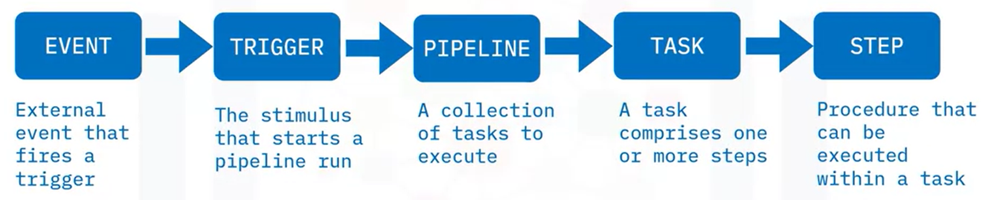

To understand how Tekton works, let’s take a look at a few conceptual building blocks that exemplify the workflow.

**Event**
* There is the concept of an event.
* This is an external event that causes a trigger to fire.
* This might be a `pull` request or a `push` to a Git repository.

**Trigger**
* A trigger is fired by an event and is the stimulus that starts a pipeline run, which executes a pipeline.

**Pipeline**
* Triggers point to pipelines, which are **collections of tasks to execute**.
* There's no limit to the number of tasks you could have in a pipeline.
* These tasks can execute serially or in parallel.

**Task**
* A task is a unit of work that **comprises one or more steps**.
* It can also define **parameters** required to carry out the steps and **workspaces** needed to store artifacts.

**Steps**
* Finally, you have the steps, which are the **actual commands that are executed** to carry out the tasks.
* These can be anything you like, but most often, they are shell scripts that execute commands to build, test, and deploy applications.

# Physical building blocks

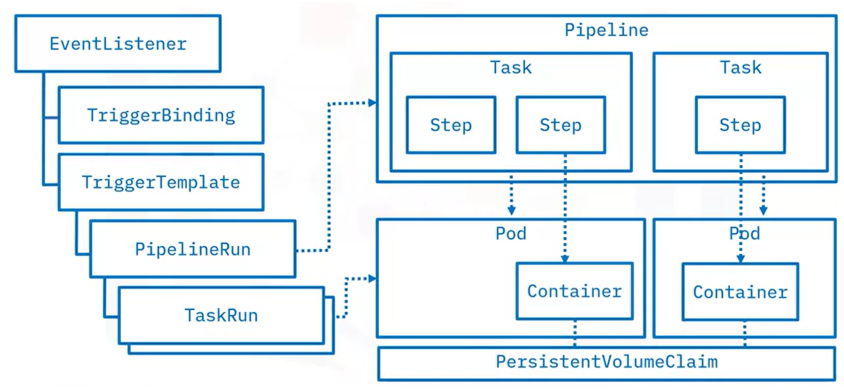

Now that you’ve seen how Tekton works conceptually. A closer look reveals that **Tekton is a set of Kubernetes custom resource definitions** (`CRDs`). Let's explain each one in order of execution.

**EventListener**:
* To handle events, you have a CRD called `EventListener` that listens for events like pull requests or commits on a Git repository.
* Events are associated with two other CRDs called `TriggerBinding` and `TriggerTemplate`.

**TriggerBinding**: The `TriggerBinding` captures parameters from the event that are required to run the pipeline.

**TriggerTemplate**:
* `TriggerTemplate` takes the parameters from the `TriggerBinding` and associates them with the `PipelineRun`.
* When triggered by an event, the `TriggerTemplate` creates a `PipelineRun`, passing along any parameters from the triggered event, or persistent storage, that the pipeline might need.
* It's important to note that **you could also manually create `PipelineRuns`** and not use events, but CI/CD pipelines are usually driven by events.

**PipelineRun**:
* The `PipelineRun` is what **instantiates a `pipeline`**.
* **A `pipeline` is a collection of `tasks`**.
* These **`tasks` can run in parallel**, at the same time, which is the default.
* The **`tasks` can also run serially**, one after the other, if you specify dependencies between them.
* Each `task` comprises a series of `steps`.
* The `steps` run in the sequence specified in the task.

**TaskRun**:
* When a pipeline executes, the `PipelineRun` CRD is responsible for managing the tasks.
* It does this by creating a `TaskRun` for each task, which, in turn, creates a **Kubernetes `pod` for the task** to run in.
* **All the steps for a task run in the same pod**.
* As the **steps are executed as a container in the pod**, one for each step to run in.
* If the tasks are running in parallel, the containers for each task will be created at once, as in this example.

**PersistentVolumeClaim**:
* Usually, a **PersistentVolumeClaim** is created, and **the storage is attached to all the pods** so that they can share artifacts throughout the `pipeline`.
* This allows you to check out code in one task, run unit tests on it in another task, and create a container image from it in yet another task.
* Most pipelines require some form of persistent storage.
* Since **steps are always run in series**, the **containers will be created one at a time**, each one starting when the previous one ends.

> **Everything about Tekton is Kubernetes native.**
> * Everything is running in your Kubernetes cluster with no external CI/CD servers required.
> * This is one of the things that makes Tekton the perfect technology for CI/CD with Kubernetes.

# Building Tekton Pipeline

## High level Pipeline Design

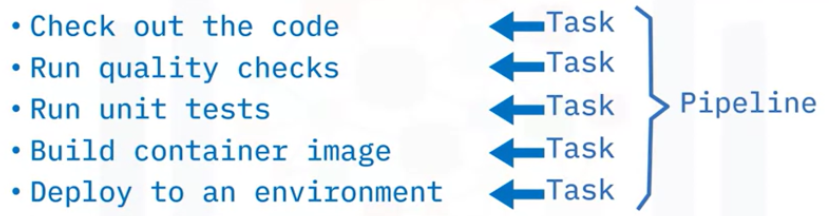

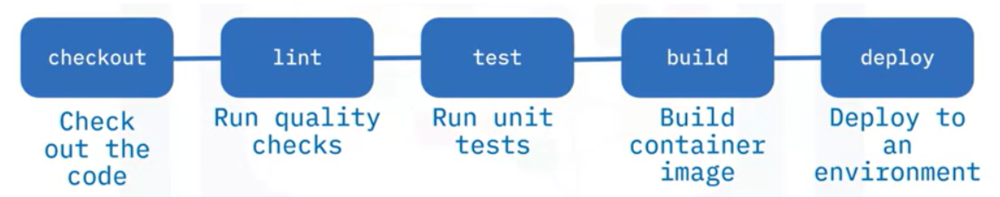

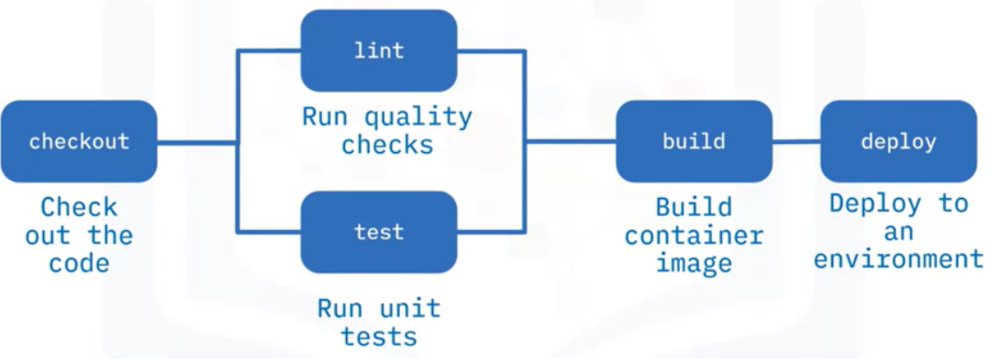

## Checkout task

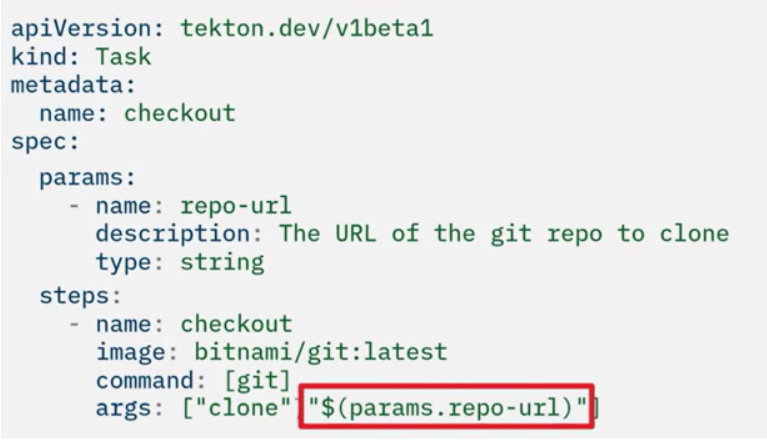

* Task is a collection of steps.
* Each task runs on a pod.
* **Every step executes in a new container in that pod**.

## Pipeline

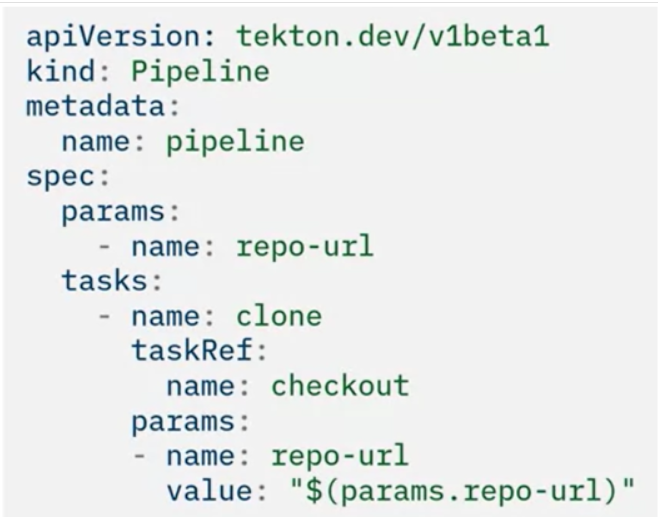

## Updated Pipeline

### `task.yaml`
```
apiVersion: tekton.dev/v1beta1
kind: Task
metadata:
  name: echo
spec:
  params:
    - name: message
      description: The message to echo
      type: string
  steps:
    - name: echo-message
      image: alpine:3
      command: [/bin/echo]
      args: ["$(params.message)"]

---


apiVersion: tekton.dev/v1beta1
kind: Task
metadata:
  name: checkout
spec:
  params:
    - name: repo-url
      description: The URL of the git repo to clone
      type: string
    - name: branch
      description: The branch to clone
      type: string
  steps:
    - name: checkout
      image: bitnami/git:latest
      command: [git]
      args: ["clone", "--branch", "$(params.branch)", "$(params.repo-url)"]
```

### `pipeline.yaml`
```
apiVersion: tekton.dev/v1beta1
kind: Pipeline
metadata:
  name: hello-pipeline
spec:
  params:
    - name: message
  tasks:
    - name: hello
      taskRef:
        name: echo
      params:
        - name: message
          value: "$(params.message)"

---

apiVersion: tekton.dev/v1beta1
kind: Pipeline
metadata:
  name: cd-pipeline
spec:
  params:
    - name: repo-url
    - name: branch
      default: "master"
  tasks:
    - name: clone
      taskRef:
        name: checkout
      params:
      - name: repo-url
        value: "$(params.repo-url)"
      - name: branch
        value: "$(params.branch)"

    - name: lint
      taskRef:
        name: echo
      params:
      - name: message
        value: "Calling Flake8 linter..."
      runAfter:
        - clone

    - name: tests
      taskRef:
        name: echo
      params:
      - name: message
        value: "Running unit tests with PyUnit..."
      runAfter:
        - lint

    - name: build
      taskRef:
        name: echo
      params:
      - name: message
        value: "Building image for $(params.repo-url) ..."
      runAfter:
        - tests

    - name: deploy
      taskRef:
        name: echo
      params:
      - name: message
        value: "Deploying $(params.branch) branch of $(params.repo-url) ..."
      runAfter:
        - build
```

## Run the pipeline

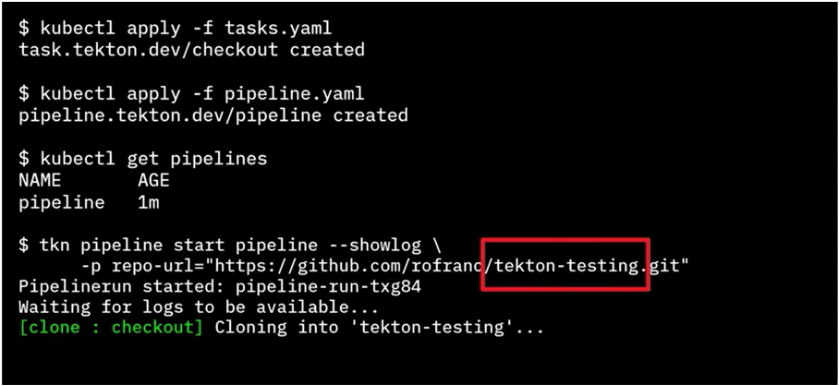

`kubectl apply -f tasks.yaml`

`kubectl apply -f pipeline.yaml`

`kubectl get pipelines`

**Finally, you’re ready to run your pipeline with the following command:**

```
tkn pipeline start pipeline --showlog -p repo-url="https://github.com/rofranc/tekton-testing.git"
```

# Tekton Triggers

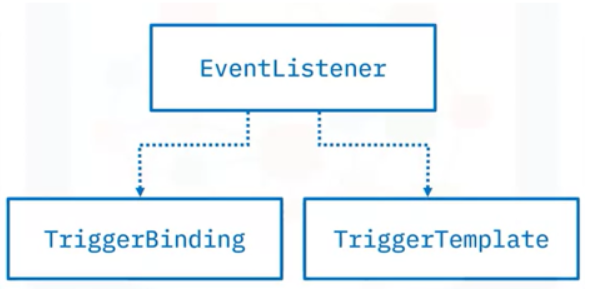

* The `TriggerBinding` CRD, which takes data from the event and binds it to the properties in your pipeline.
* The `TriggerTemplate` CRD, which takes data from the binding and instantiates a `PipelineRun`, passing in that data.

## Tekton Trigger Flow

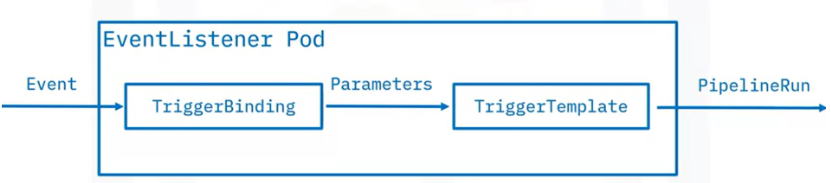

## EventListener

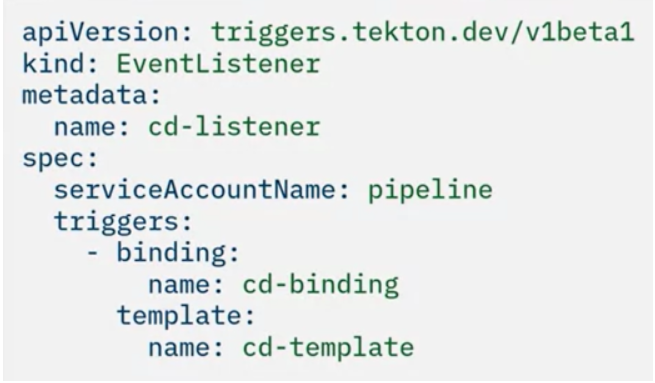

* You specify the `serviceAccountName` of the **ServiceAccount** that the pipeline should run under.
* In OpenShift, there is a preconfigured **ServiceAccount** named **"pipeline"** that is configured with the access control needed to run a pipeline, so you use that.

## TriggerBinding

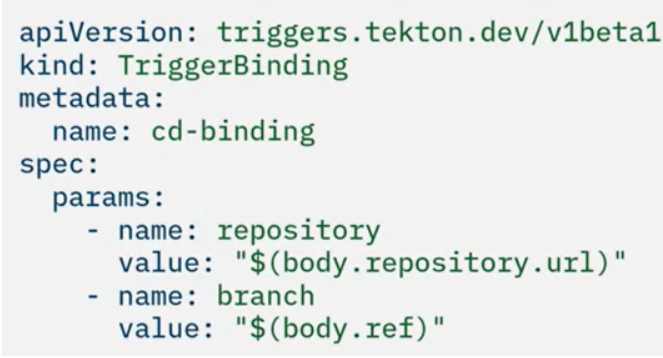

## TriggerTemplate

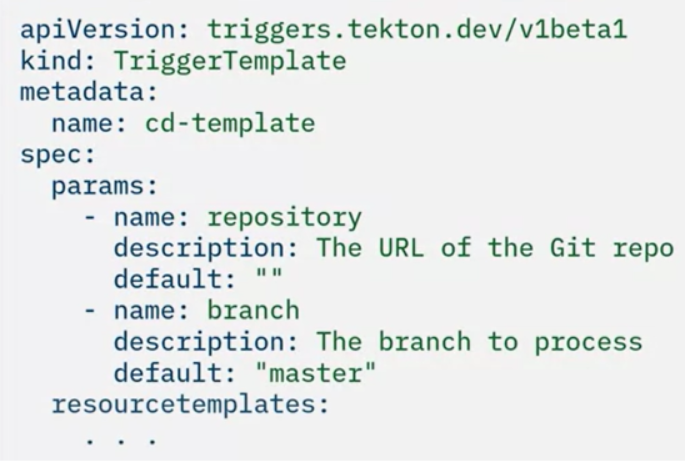

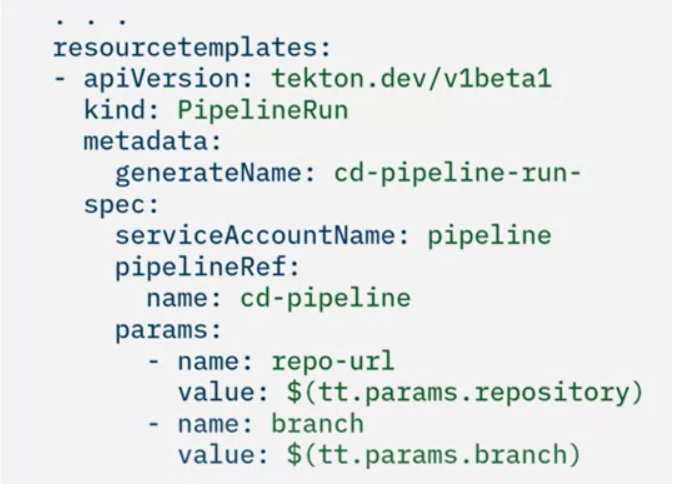

* In the `metadata` section, you could give it a `name`, or in this case, you could use **"generateName"** and specify a partial name.
* This **generates a unique ID** and appends it to the partial name that you supply.
* This is an effective way of giving all your pipeline runs a unique name.

## Parameter flow

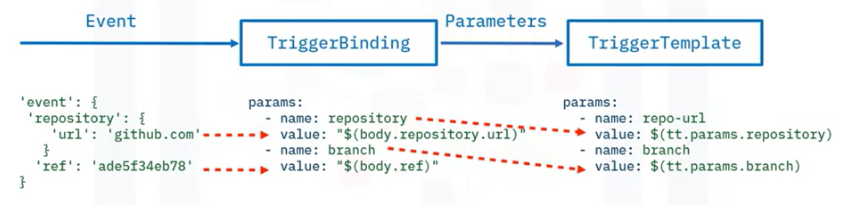

## Run the pipeline

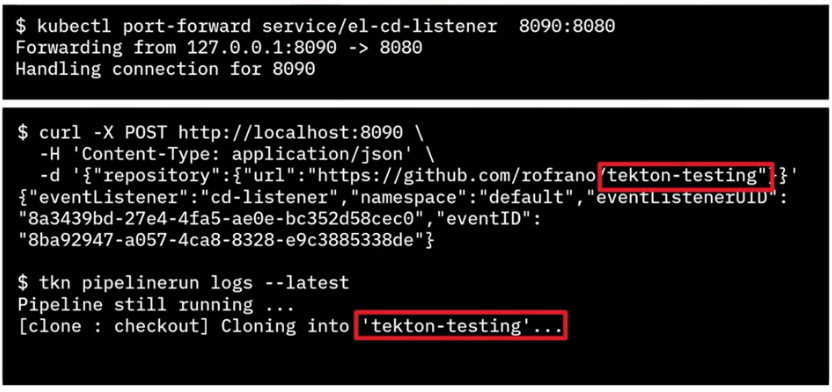

`tekton pipelinerun logs --latest`

# Tekton catalog/Hub

* The **Tekton catalog**, also known as the **Tekton Hub**, is a repository of Tekton tasks that have been contributed by the community, representing a collection of reusable parts that you can use to build a CI/CD pipeline.
* It’s located at `hub.tekton.dev`.
* Before writing your own tasks, you should always check the Tekton catalog to see if someone else has already written one that you can use.
* This not only saves hours of creating and debugging tasks, but many more hours of task maintenance as well.
* **Remember:** A line of code that you didn’t write is a line of code that you don't have to maintain.

**Categories of Tasks available at the Tekton Hub**:

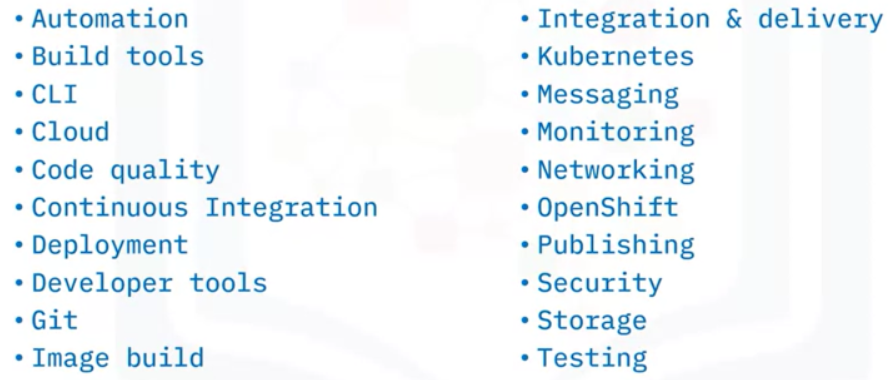

**When you select a task and view the details, you see information about the following**:

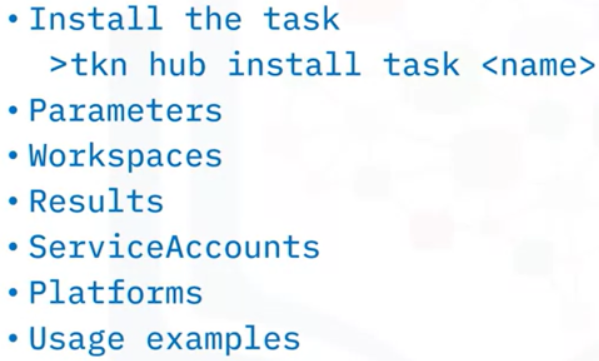

**Example `git-clone` Task:**

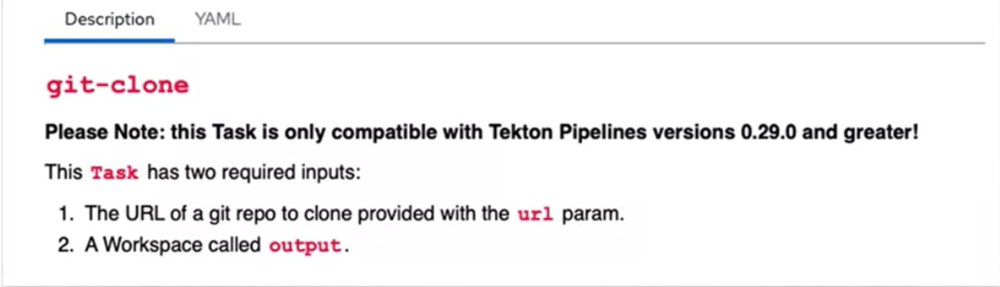

# What is a workspace?

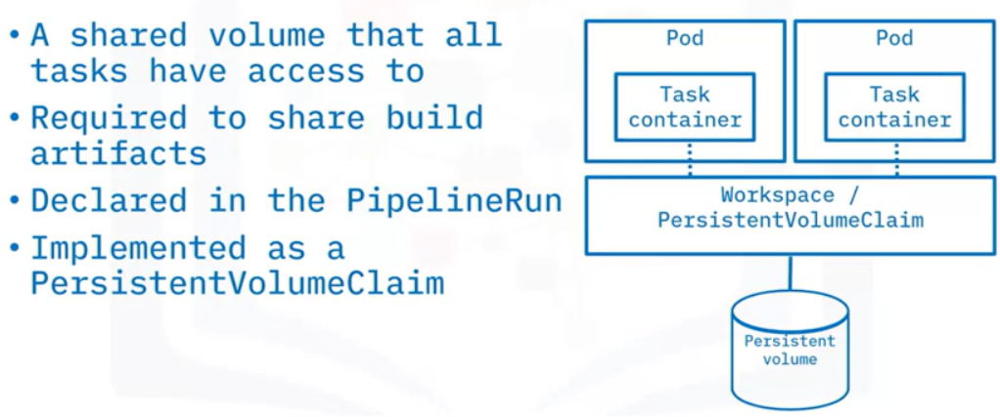

* Remember that with Tekton, 
    * each task runs in its own pod.
    * every pod is isolated from every other pod.
* That makes it difficult to transfer data between tasks.
* A **workspace** is a shared volume that each task has access to which allows them to transfer/share data.
* A **workspace** is a **Kubernetes `PersistentVolumeClaim`** CRD.
* Workspaces are declared in the `PipelineRun`.
* Because they are implemented as a **Kubernetes `PersistentVolumeClaim`**, it is up to the `PipelineRun` to map from the name of the `workspace` that the pipeline is expecting to a `PersistentVolumeClaim` that the pipeline can use to store its artifacts. 

## Defining a workspace

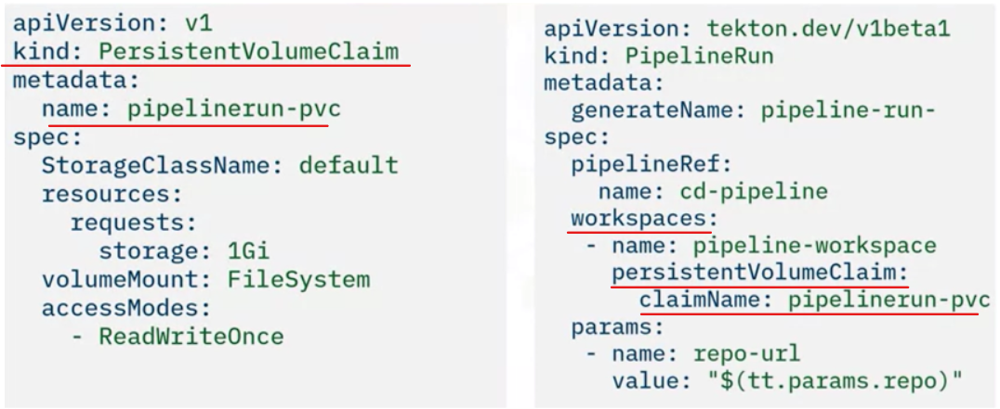

## Example git-clone

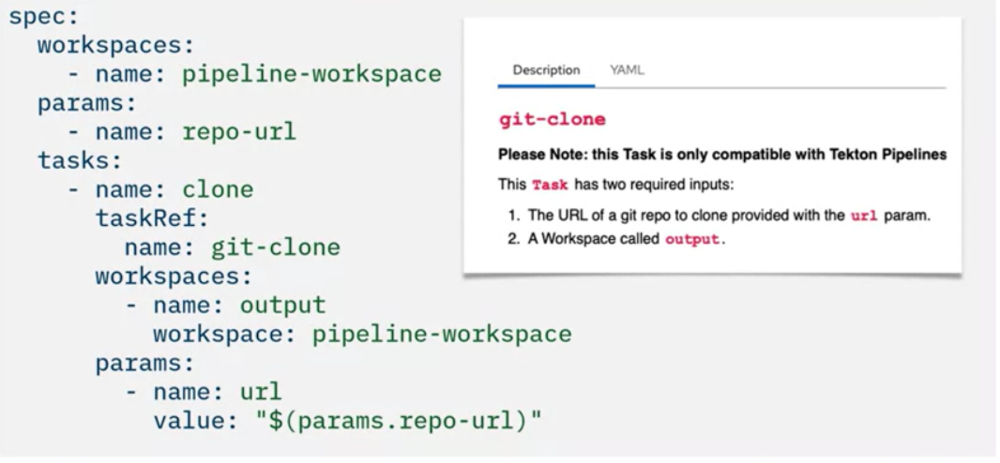

## Updated pipeline

### `pvc.yaml`

```
apiVersion: v1
kind: PersistentVolumeClaim
metadata:
  name: pipelinerun-pvc
spec:
  storageClassName: skills-network-learner
  resources:
    requests:
      storage:  1Gi
  volumeMode: Filesystem
  accessModes:
    - ReadWriteOnce
```

**Apply the new task definition to the cluster:**

```
kubectl apply -f pvc.yaml
```

**You should see the following output:**

```
persistentvolumeclaim/pipelinerun-pvc created
```

You can now reference this persistent volume by its name `pipelinerun-pvc` when creating workspaces for your Tekton tasks.

### `pipeline.yaml`

```
apiVersion: tekton.dev/v1beta1
kind: Pipeline
metadata:
  name: cd-pipeline
spec:
  workspaces:
    - name: pipeline-workspace
  params:
    - name: repo-url
    - name: branch
      default: "master"
  tasks:
    - name: clone
      workspaces:
        - name: output
          workspace: pipeline-workspace
      taskRef:
        name: git-clone
      params:
      - name: url
        value: $(params.repo-url)
      - name: revision
        value: $(params.branch)

    # Note: The remaining tasks are unchanged. Do not delete them.
```

**Apply the pipeline to your cluster:**

```
kubectl apply -f pipeline.yaml
```

**You should see output similar to this:**

```
$ kubectl apply -f pipeline.yaml
pipeline.tekton.dev/cd-pipeline created
```

> **Note:** *If the original pipeline was already created, you will see the word “configured” instead of “created.”*

You are now ready to run your pipeline.

You can now use the **Tekton CLI (`tkn`)** to create a `PipelineRun` to run the pipeline.

Use the following command to run the pipeline, passing in:
* the URL of the repository,
* the branch to clone,
* the workspace name, and
* the persistent volume claim name.

```
tkn pipeline start cd-pipeline \
    -p repo-url="https://github.com/ibm-developer-skills-network/wtecc-CICD_PracticeCode.git" \
    -p branch="main" \
    -w name=pipeline-workspace,claimName=pipelinerun-pvc \
    --showlog
```

**You should see output similar to this:**

```
PipelineRun started: cd-pipeline-run-mndgw
Waiting for logs to be available...
```

**Eventually, you should see the output from the logs.**

> **Note:** *There will be multiple lines of output from `[clone: clone]`. These are not represented below for clarity.*

```
[clone : clone] <- There will be many lines from git-clone
[clone : clone] ...
[lint : echo-message] Calling Flake8 linter...
[tests : echo-message] Running unit tests with PyUnit...
[build : echo-message] Building image for https://github.com/ibm-developer-skills-network/wtecc-CICD_PracticeCode.git ...
[deploy : echo-message] Deploying main branch of https://github.com/ibm-developer-skills-network/wtecc-CICD_PracticeCode.git ...
```

**You can always see the pipeline run status by listing the `PipelineRuns` with:**
```
tkn pipelinerun ls
```

**You can check the logs of the last run with:**

```
tkn pipelinerun logs --last
```

# Creating tasks for quality checks and unit tests execution

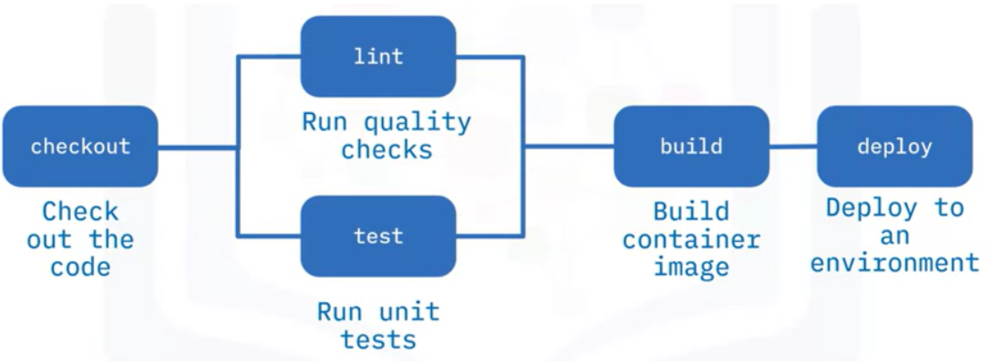

## Define your own task

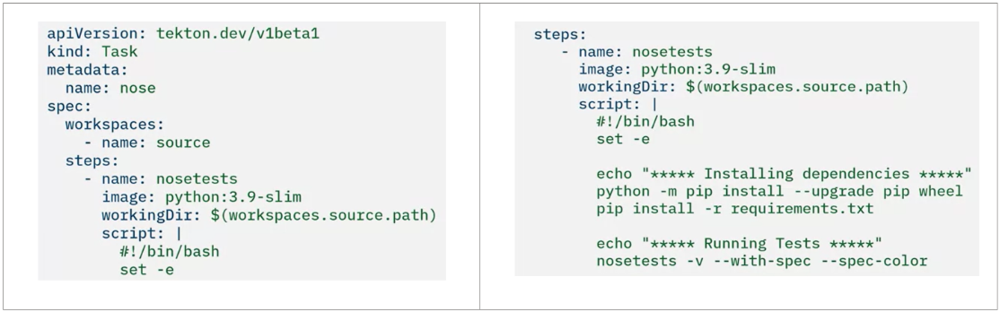

You want to be sure that when your test command runs, it's in the same directory as the code.
* You use the **"`workingDir`"** option to specify the path of the root of the workspace.
* To do this, you use the word **"`workspaces.`"** followed by the name of the workspace, which is **"`source`"**, followed by the word **"`.path`"**.
* That makes the reference **"`$(workspaces.source.path)`"**.

## Using environment properties inject Secret Credentials

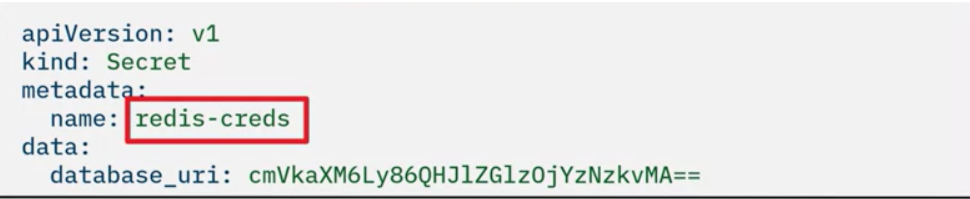

## Update the task

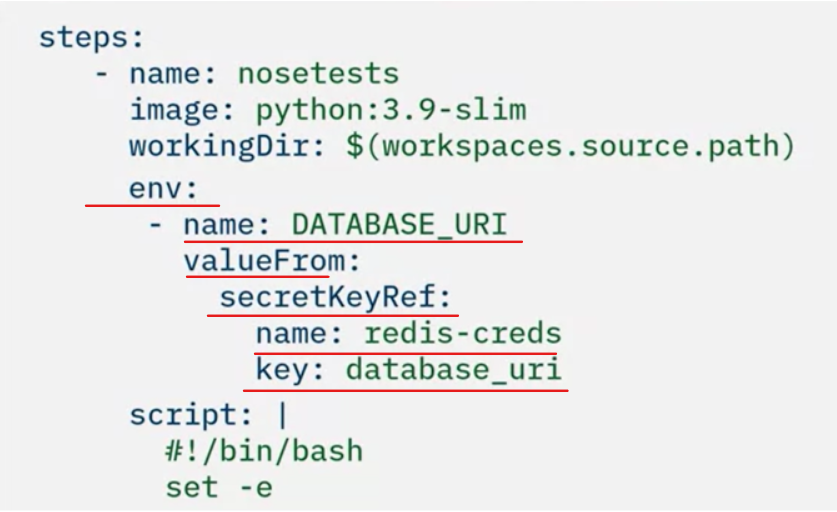

## Linting Script

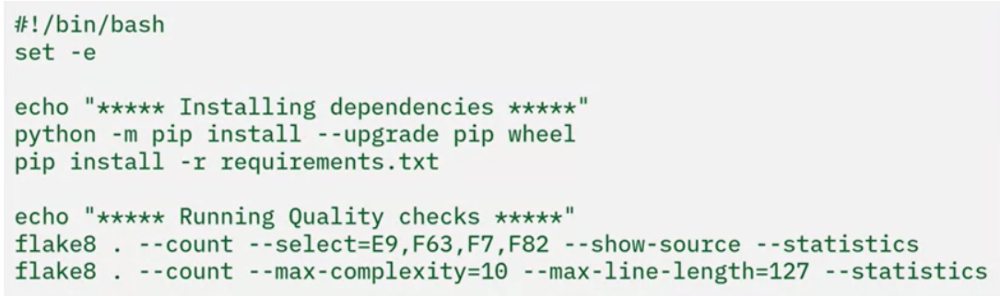

## Add tests and lint to the pipeline

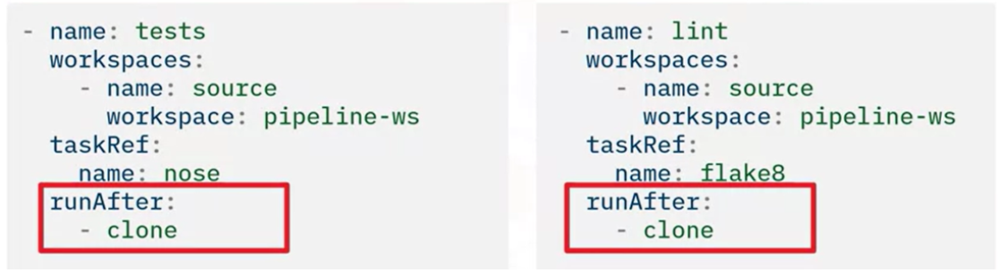

# Building Image

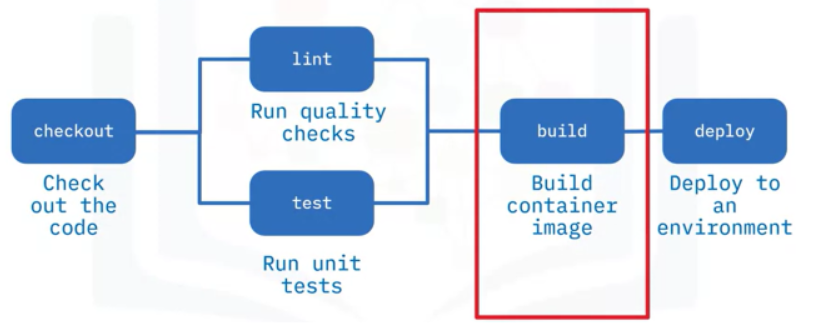

So far in **creating your CD pipeline**, you have addressed checking out the code by cloning it from GitHub, and running quality checks and unit tests like `flake8` and `nose`.

Now it's time to **build a container image** in preparation to deploy to Kubernetes.
* The purpose of the image build stage is to build a container image that you can push to a registry in preparation for deploying it into a Kubernetes environment.
* It's a good habit to get into searching the **Tekton catalog** at **Tekton Hub** for any new tasks you might need including this build task.
* In fact, you can also use the **Tekton CLI** "`hub`" command to search for pipelines and tasks.

Let's see how that works.

## Results from Tekton Hub Search

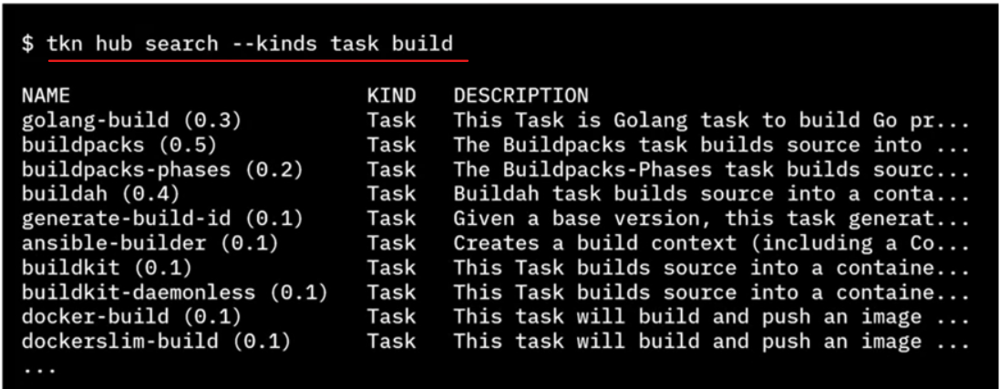

* All the tasks that match the **"build"** keyword are returned.
* We'll be using **buildah**.
* The **buildah** task builds your source into a container image from a **Dockerfile** and then pushes it to a container registry using Project Atomic's Buildah build tool.

## Install the buildah task

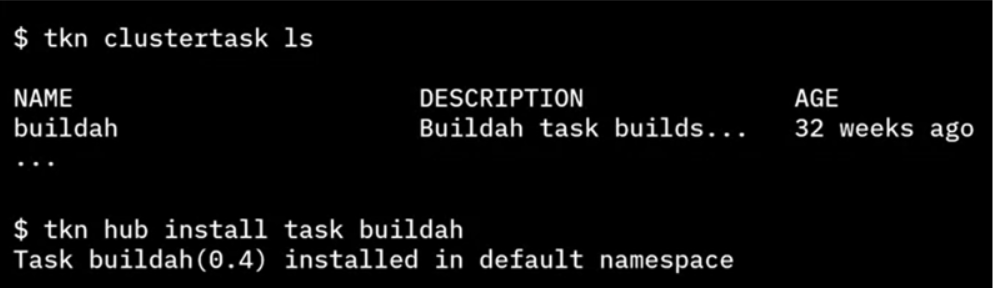

I'd like to point out that **administrators can install tasks at the cluster level**.
* It's always a good idea to use the command: `tkn clustertask ls` to see what cluster tasks are installed.
* In this example, **buildah** is **installed at the cluster level** so there is no need to install it locally into your namespace.
* Anyone in the cluster can use cluster tasks in their pipelines.
* If it isn’t installed at the cluster level, you can install the **buildah** task into your local namespace using the **Tekton CLI**.
* The command is `tkn hub install task` followed by the name of the task you want to install, which in this case is `buildah`.
* You should see a result returned that indicates that **buildah** has been installed into your current namespace.

## Read the documentation

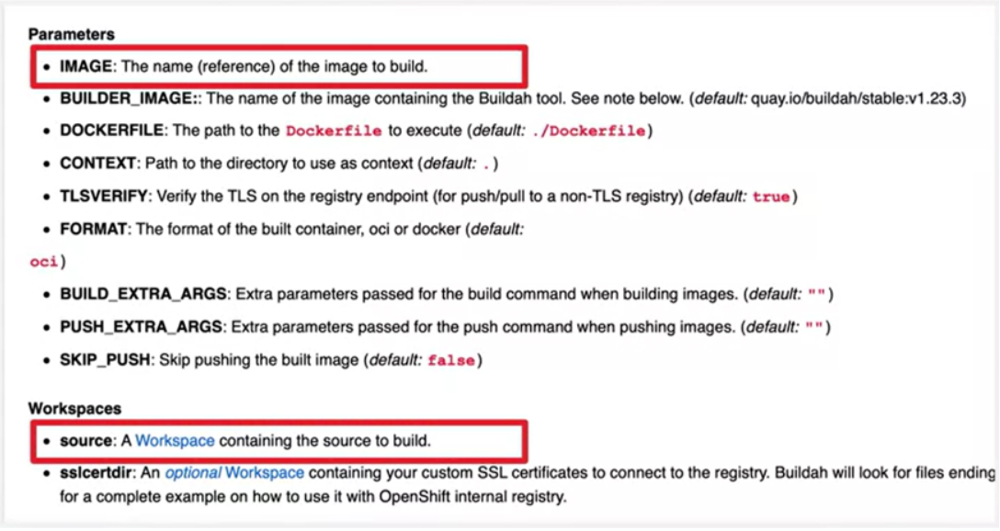

**How do you make use of the buildah task?**
* When you read the `buildah` documentation on **Tekton Hub**, you see that the only required parameter is the `IMAGE` parameter because it doesn't have a default.
* You also see that it requires a workspace named `source`.
* With those two pieces of information, you are ready to add the buildah task to your **Tekton pipeline**.

## Add buildah to the pipeline

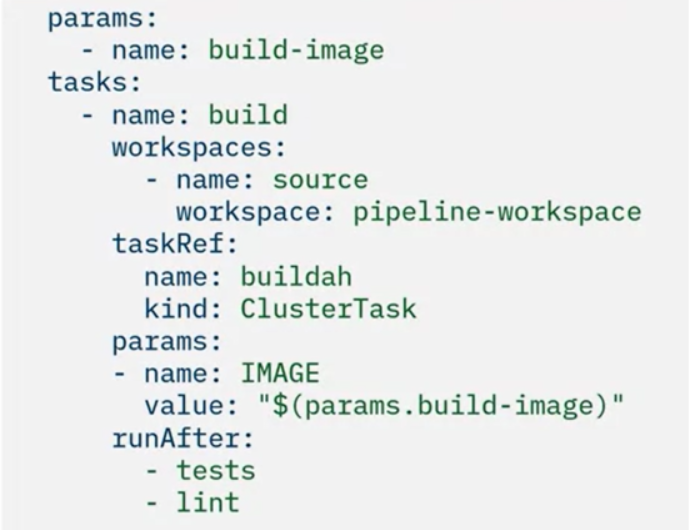

## Start the Pipeline

When you start the pipeline, you need to pass in the `build-image` parameter, which is the name of the image to build.

This will be different for every learner that uses this lab. Here is the format:
```
image-registry.openshift-image-registry.svc:5000/$SN_ICR_NAMESPACE/tekton-lab:latest
```

Notice the variable `$SN_ICR_NAMESPACE` in the image name. This is automatically set to point to your container namespace.

Now, start the pipeline to see your new build task run. Use the Tekton CLI `pipeline start` command to run the pipeline, passing in the parameters `repo-url`, `branch`, and `build-image` using the `-p` option. Specify the workspace `pipeline-workspace` and volume claim `pipelinerun-pvc` using the `-w` option:
```
tkn pipeline start cd-pipeline \
    -p repo-url="https://github.com/ibm-developer-skills-network/wtecc-CICD_PracticeCode.git" \
    -p branch=main \
    -p build-image=image-registry.openshift-image-registry.svc:5000/$SN_ICR_NAMESPACE/tekton-lab:latest \
    -w name=pipeline-workspace,claimName=pipelinerun-pvc \
    --showlog
```

You should see `Waiting for logs to be available...` while the pipeline runs. The logs will be shown on the screen. Wait until the pipeline run completes successfully.

## Check the Run Status

**You can see the pipeline run status by listing the pipeline runs with:** `tkn pipelinerun ls`

**You should see:**

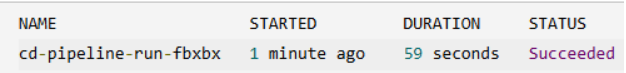

**You can check the logs of the last run with:** `tkn pipelinerun logs --last`

# Deploying to Kubernetes

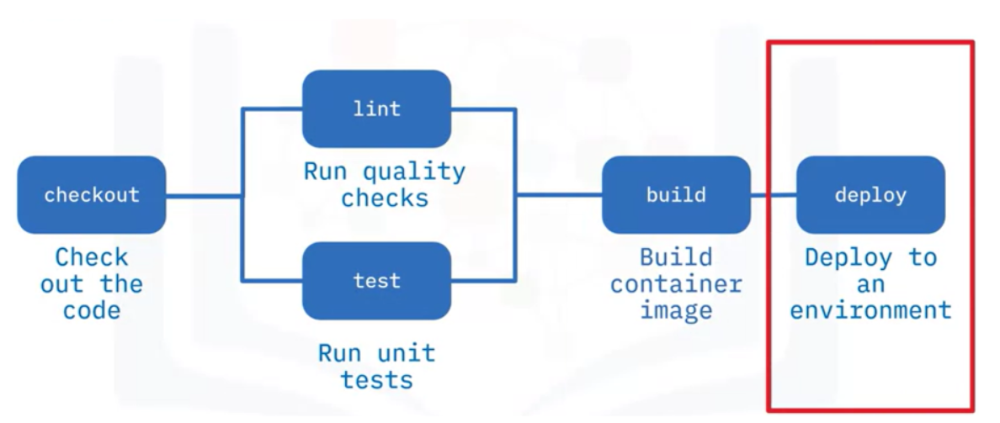

You are now at the final stage of your CD pipeline.

You have addressed:
* checking out the code by cloning it from GitHub, 
* running quality checks and unit tests like flake8 and nose, and 
* you have built a container image and pushed it to a local registry.

Now it's time to deploy your application to an environment, specifically Kubernetes.

## Application deployment options